In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import umap

#rkwmdk gg

In [2]:
# matplot setting

plt.rcParams["figure.figsize"] = (10,9)

In [3]:
import sys
module_path='/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/'
if module_path not in sys.path:
    sys.path.append(module_path)

from cohort_loader_new_version0229 import *

mimic_data_dir = '/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Case Labeling/mimic_analysis(new_version0229).csv.gz'

df_raw = pd.read_csv(mimic_data_dir, compression='gzip')
df_raw = df_raw[~(df_raw['gender']==2)].reset_index(drop=True)
df_raw = df_raw.drop('Shock_next_12h', axis = 1)
df_raw.replace([np.inf, -np.inf], np.nan, inplace=True)
df_raw.fillna(0, inplace=True) 

df_raw = df_raw[~(df_raw['Case']=='event')]
df_raw = df_raw[~((df_raw['Case']==4)&(df_raw['Annotation']=='no_circ'))]
df_raw['Case'] = pd.to_numeric(df_raw['Case'], errors='coerce')

df_train, _ = data_split(df_raw, 9040, 0.9, 0.05, 1, mode = 'mimic')

c:\Users\DAHS\anaconda3\envs\DL\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


========== 데이터셋 분할 정보 ==========
데이터셋 비율: 학습 = 0.90, 테스트 = 0.10
학습셋 클래스 비율: Case
1.0    473941
2.0      5128
3.0     15571
4.0     15705
Name: count, dtype: int64
테스트셋 클래스 비율: Case
1.0    53103
2.0      512
3.0     1253
4.0     1271
Name: count, dtype: int64
--------------------------------------
========== 클래스 비율 ==========
학습셋 클래스 비율: 0.93:0.01:0.03:0.03
테스트셋 클래스 비율: 0.95:0.01:0.02:0.02
--------------------------------------
========== 환자 및 체류 정보 ==========
학습셋 환자 수: 2907
테스트셋 환자 수: 329
학습셋 체류 수: 2961
테스트셋 체류 수: 330
--------------------------------------
========== 실험 설정 ==========
분할 시드: 9040
학습 비율: 0.9
임계값: 0.05
--------------------------------------
========== 실행 결과 ==========
총 소요 시간(초): 0.38
시도한 시행 횟수: 0


In [4]:
x_save_load = np.load('/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/Train/result/emb_train_new_version(0303).npy')
train_output = pd.DataFrame(x_save_load)

In [7]:
total_train = pd.concat([df_train, train_output], axis = 1).reset_index(drop=True)

import pandas as pd

sampled_dfs = []
for case in total_train['Case'].unique():
    # 현재 Case의 데이터 개수 확인
    case_count = total_train[total_train['Case'] == case].shape[0]
    n_samples = min(case_count, 25000)
    
    sampled_case_df = total_train[total_train['Case'] == case].sample(n=n_samples, random_state=1)
    sampled_dfs.append(sampled_case_df)

final_sampled_df = pd.concat(sampled_dfs)

print(final_sampled_df.shape)

(61404, 306)


In [10]:
feature = final_sampled_df[final_sampled_df.columns[:228]]

In [11]:
from sklearn.manifold import TSNE

class_feat = final_sampled_df['Case'].values

n_components = 2
model = TSNE(n_components=n_components,perplexity=30.0, random_state=42)
X_embedded = model.fit_transform(feature.drop(['INDEX', 'Shock_next_8h', 'Case', 'Annotation'], axis = 1))

tsne_ori_feat_df = pd.DataFrame(X_embedded, columns = ['component 0', 'component 1'])
tsne_ori_feat_df['Case'] = class_feat

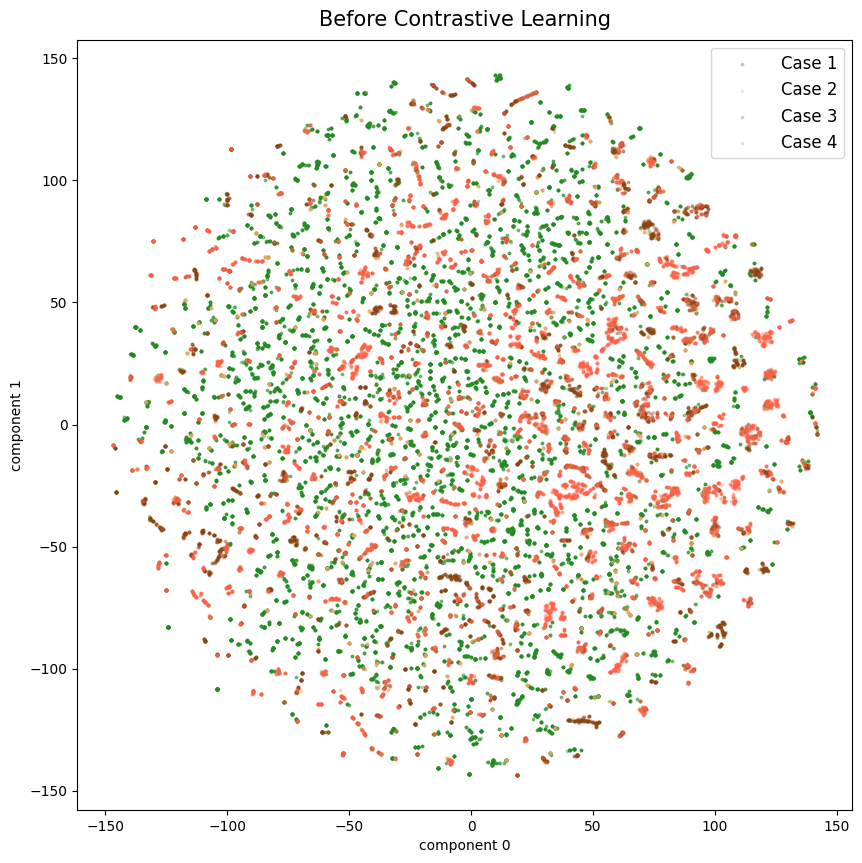

In [12]:
plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

ori_df_1 = tsne_ori_feat_df[tsne_ori_feat_df['Case'] == 1]
ori_df_2 = tsne_ori_feat_df[tsne_ori_feat_df['Case'] == 2]
ori_df_3 = tsne_ori_feat_df[tsne_ori_feat_df['Case'] == 3]
ori_df_4 = tsne_ori_feat_df[tsne_ori_feat_df['Case'] == 4]


# target 별 시각화

plt.scatter(ori_df_1['component 0'], ori_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(ori_df_2['component 0'], ori_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(ori_df_3['component 0'], ori_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(ori_df_4['component 0'], ori_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('Before Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

In [16]:
feature = final_sampled_df[final_sampled_df.columns[228:]]

In [18]:
from sklearn.manifold import TSNE

class_feat = final_sampled_df['Case'].values

n_components = 2
model = TSNE(n_components=n_components,perplexity=30.0, random_state=42)
X_embedded = model.fit_transform(feature)

tsne_emb_feat_df = pd.DataFrame(X_embedded, columns = ['component 0', 'component 1'])
tsne_emb_feat_df['Case'] = class_feat

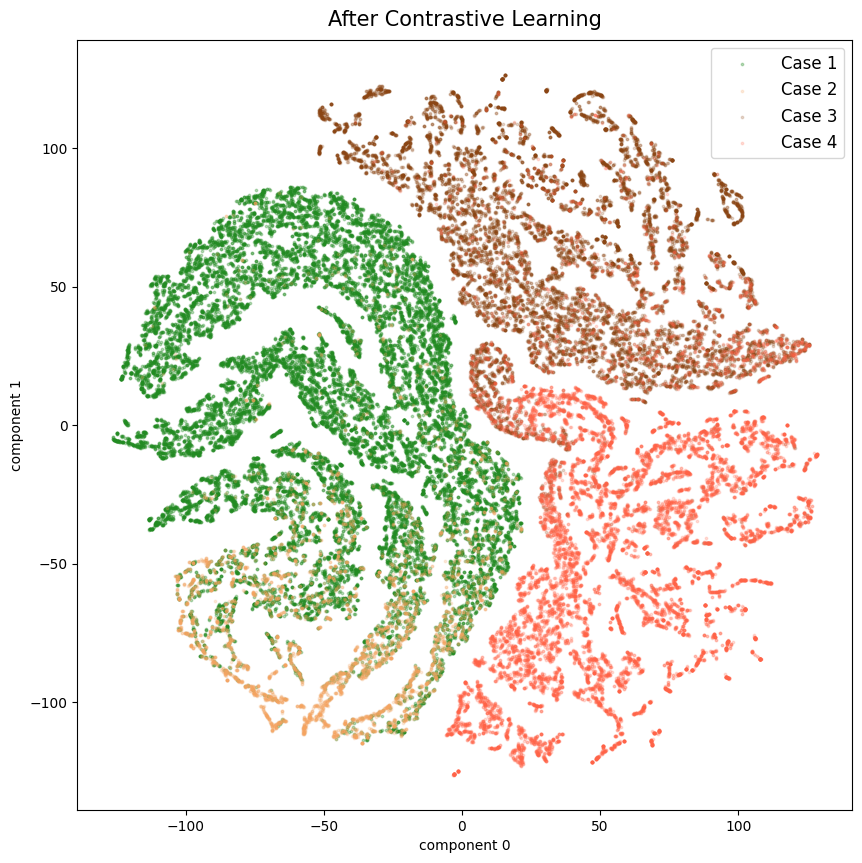

In [19]:
plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

c_tsne_df_1 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 1]
c_tsne_df_2 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 2]
c_tsne_df_3 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 3]
c_tsne_df_4 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 4]


# target 별 시각화

plt.scatter(c_tsne_df_1['component 0'], c_tsne_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(c_tsne_df_2['component 0'], c_tsne_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(c_tsne_df_3['component 0'], c_tsne_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(c_tsne_df_4['component 0'], c_tsne_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

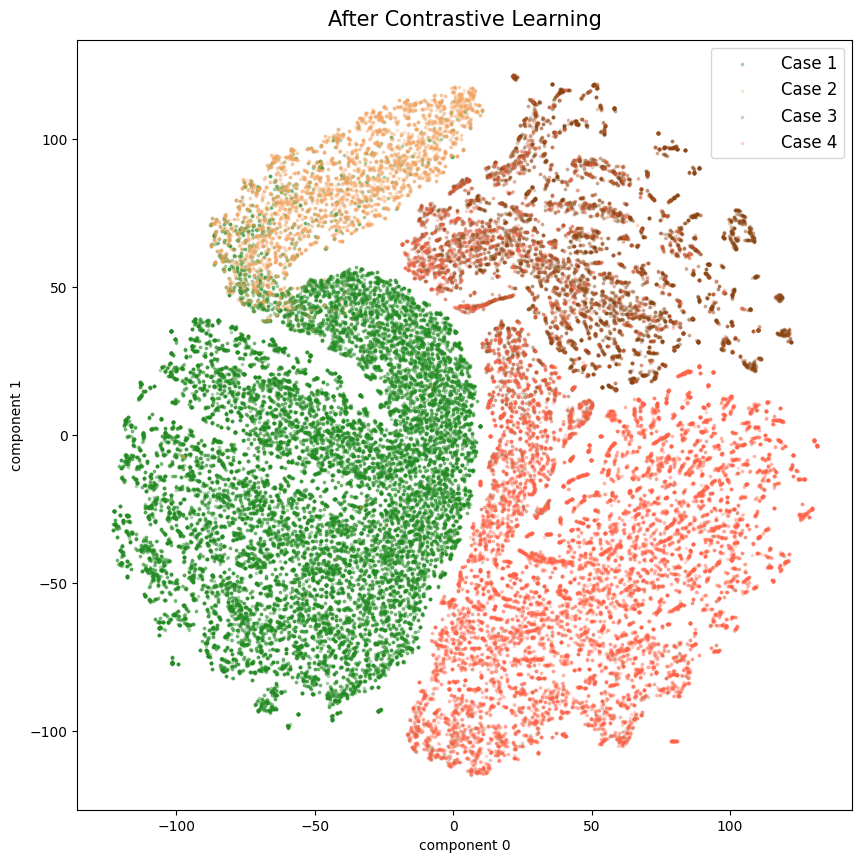

In [19]:
plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

c_tsne_df_1 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 1]
c_tsne_df_2 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 2]
c_tsne_df_3 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 3]
c_tsne_df_4 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 4]


# target 별 시각화

plt.scatter(c_tsne_df_1['component 0'], c_tsne_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(c_tsne_df_2['component 0'], c_tsne_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(c_tsne_df_3['component 0'], c_tsne_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(c_tsne_df_4['component 0'], c_tsne_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

In [12]:
class_feat = final_sampled_df['Case'].values

reducer_feat = umap.UMAP(n_neighbors = 50)
umap_emb_feat_total = reducer_feat.fit_transform(feature)

umap_emb_feat_df_total = pd.DataFrame(umap_emb_feat_total, columns = ['component 0', 'component 1'])
umap_emb_feat_df_total['Case'] = class_feat

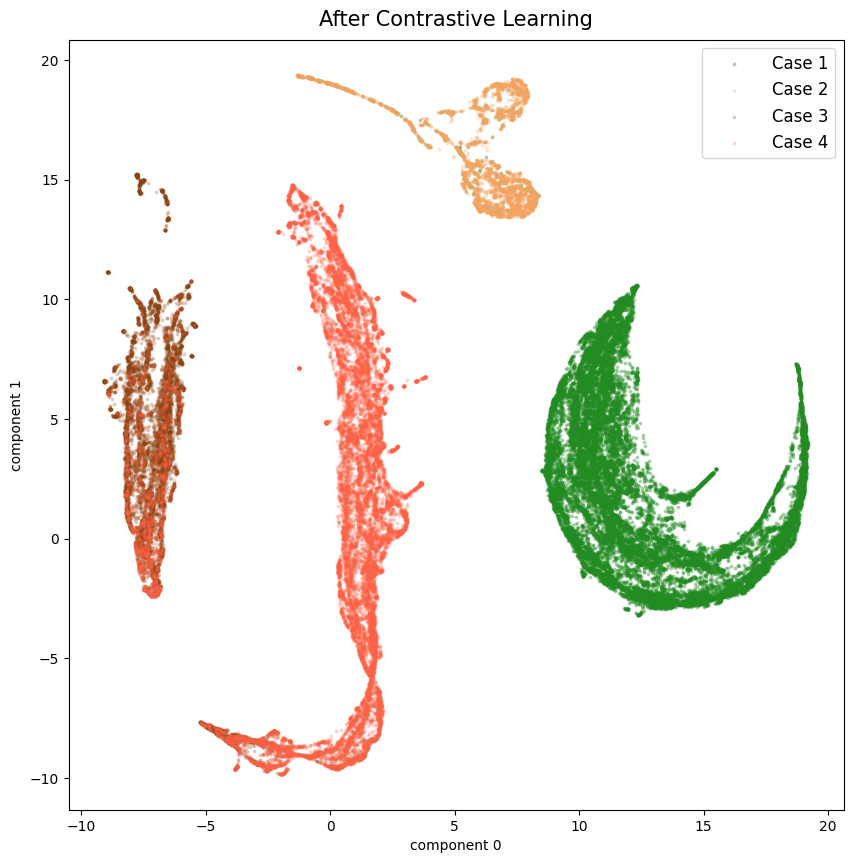

In [13]:
plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

umap_df_1 = umap_emb_feat_df_total[umap_emb_feat_df_total['Case'] == 1]
umap_df_2 = umap_emb_feat_df_total[umap_emb_feat_df_total['Case'] == 2]
umap_df_3 = umap_emb_feat_df_total[umap_emb_feat_df_total['Case'] == 3]
umap_df_4 = umap_emb_feat_df_total[umap_emb_feat_df_total['Case'] == 4]


# target 별 시각화

plt.scatter(umap_df_1['component 0'], umap_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(umap_df_2['component 0'], umap_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(umap_df_3['component 0'], umap_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(umap_df_4['component 0'], umap_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

In [21]:
import sys
module_path='/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/'
if module_path not in sys.path:
    sys.path.append(module_path)

from cohort_loader_new_version0229 import *

eicu_data_dir = '/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Case Labeling/eicu_analysis(new_version0229).csv.gz'
df_raw_eicu = pd.read_csv(eicu_data_dir, compression='gzip')
df_raw_eicu = df_raw_eicu.drop('Shock_next_12h', axis = 1)

df_raw_eicu = df_raw_eicu[~(df_raw_eicu['gender']==2)].reset_index(drop=True)

df_raw_eicu.replace([np.inf, -np.inf], np.nan, inplace=True)
df_raw_eicu.fillna(0, inplace=True) 

df_raw_eicu = df_raw_eicu[~(df_raw_eicu['Case']=='event')]
df_raw_eicu = df_raw_eicu[~((df_raw_eicu['Case']==4)&(df_raw_eicu['Annotation']=='no_circ'))]
df_raw_eicu['Case'] = pd.to_numeric(df_raw_eicu['Case'], errors='coerce')

eicu_save_load = np.load('/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/Train/result/emb_eicu_new_version(0303).npy')
test_output = pd.DataFrame(eicu_save_load)

In [24]:
from sklearn.manifold import TSNE

total_test = pd.concat([df_raw_eicu.reset_index(drop=True), test_output], axis = 1).reset_index(drop=True)

import pandas as pd

sampled_dfs = []
for case in total_test['Case'].unique():
    # 현재 Case의 데이터 개수 확인
    case_count = total_test[total_test['Case'] == case].shape[0]
    n_samples = min(case_count, 25000)
    
    sampled_case_df = total_test[total_test['Case'] == case].sample(n=n_samples, random_state=1)
    sampled_dfs.append(sampled_case_df)

final_sampled_df = pd.concat(sampled_dfs)

print(final_sampled_df.shape)

(61066, 305)


In [27]:
feature = final_sampled_df[final_sampled_df.columns[227:]]

In [29]:
from sklearn.manifold import TSNE

class_feat = final_sampled_df['Case'].values

n_components = 2
model = TSNE(n_components=n_components,perplexity=30.0, random_state=42)
X_embedded = model.fit_transform(feature)

tsne_emb_feat_df_test = pd.DataFrame(X_embedded, columns = ['component 0', 'component 1'])
tsne_emb_feat_df_test['Case'] = class_feat

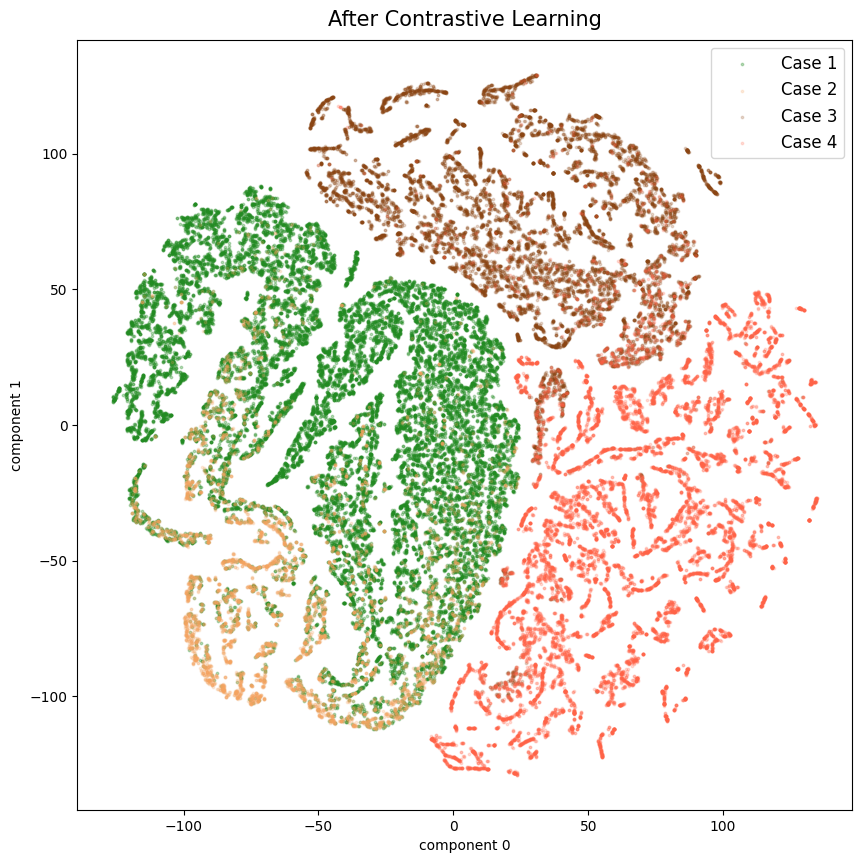

In [30]:
plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

umap_df_1 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 1]
umap_df_2 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 2]
umap_df_3 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 3]
umap_df_4 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 4]


# target 별 시각화

plt.scatter(umap_df_1['component 0'], umap_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(umap_df_2['component 0'], umap_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(umap_df_3['component 0'], umap_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(umap_df_4['component 0'], umap_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

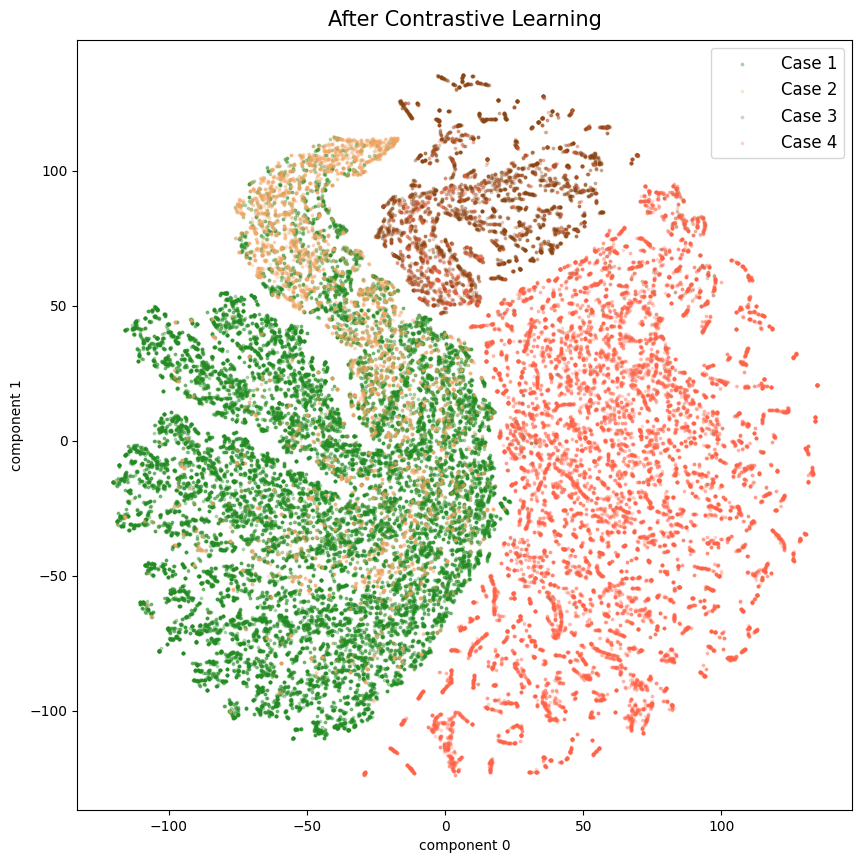

In [28]:
plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

umap_df_1 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 1]
umap_df_2 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 2]
umap_df_3 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 3]
umap_df_4 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 4]


# target 별 시각화

plt.scatter(umap_df_1['component 0'], umap_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(umap_df_2['component 0'], umap_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(umap_df_3['component 0'], umap_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(umap_df_4['component 0'], umap_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

In [3]:
import sys
module_path='/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/'
if module_path not in sys.path:
    sys.path.append(module_path)

from cohort_loader import *

eicu_data_dir = '/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Case Labeling/eicu_analysis.csv.gz'
df_raw_eicu = pd.read_csv(eicu_data_dir, compression='gzip')
df_raw_eicu = df_raw_eicu.drop('Shock_next_12h', axis = 1)

df_raw_eicu = df_raw_eicu[~(df_raw_eicu['gender']==2)].reset_index(drop=True)

df_raw_eicu.replace([np.inf, -np.inf], np.nan, inplace=True)
df_raw_eicu.fillna(0, inplace=True) 

df_raw_eicu = df_raw_eicu[~(df_raw_eicu['Case']=='event')]
df_raw_eicu['Case'] = pd.to_numeric(df_raw_eicu['Case'], errors='coerce')

eicu_save_load = np.load('/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/Train/result/emb_eicu_new_version.npy')
test_output = pd.DataFrame(eicu_save_load)

c:\Users\DAHS\anaconda3\envs\DL\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
module_path='/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Experiment(Supervised Learning)/evaluation/'
if module_path not in sys.path:
    sys.path.append(module_path)
    
import get_hospital_eicu

module_path='/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/'
if module_path not in sys.path:
    sys.path.append(module_path)

from eicu_year_process import *

data = eicu_year_process.matching_patient(df_raw_eicu)

failure_case = data[data['hospitalid']==458]
success_case = data[data['hospitalid']==300]

In [10]:
failure_case_tsne = failure_case.drop(['uniquepid', 'patientunitstayid','Annotation', 'ethnicity', 'Shock_next_8h', 'INDEX', 'hospitalid', 'hospitaldischargeyear'], axis = 1)
success_case_tsne = success_case.drop(['uniquepid', 'patientunitstayid','Annotation', 'ethnicity', 'Shock_next_8h', 'INDEX', 'hospitalid', 'hospitaldischargeyear'], axis = 1)

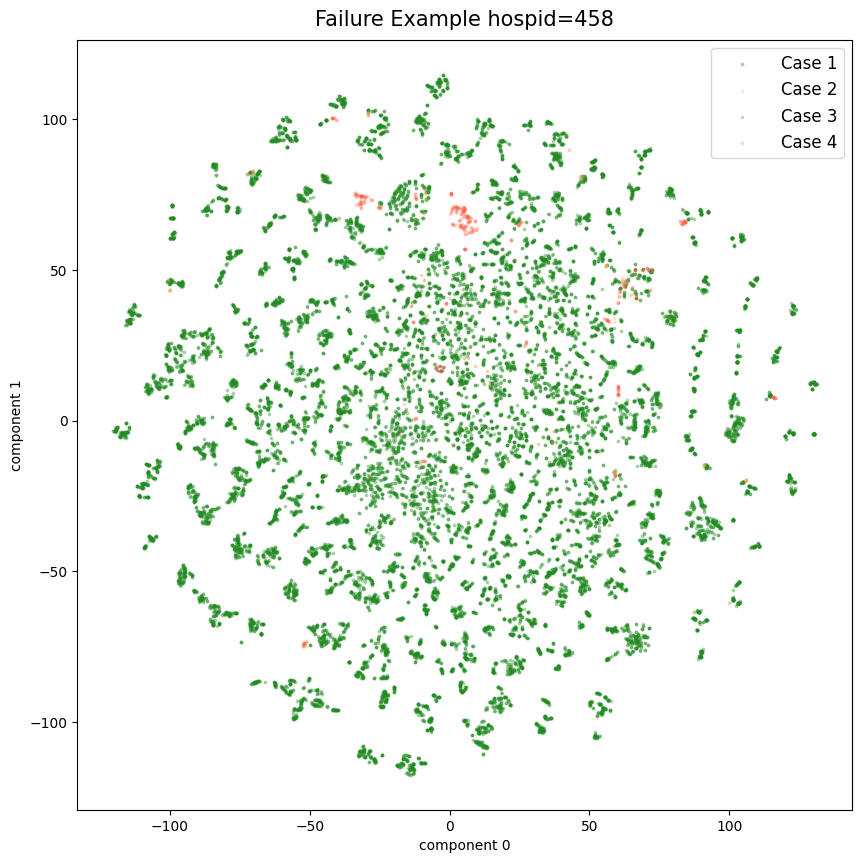

In [11]:
from sklearn.manifold import TSNE

class_feat = failure_case_tsne['Case'].values

n_components = 2
model = TSNE(n_components=n_components,perplexity=30.0, random_state=42)
X_embedded = model.fit_transform(failure_case_tsne.drop('Case', axis = 1))

tsne_emb_feat_df_test = pd.DataFrame(X_embedded, columns = ['component 0', 'component 1'])
tsne_emb_feat_df_test['Case'] = class_feat


plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

umap_df_1 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 1]
umap_df_2 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 2]
umap_df_3 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 3]
umap_df_4 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 4]


# target 별 시각화

plt.scatter(umap_df_1['component 0'], umap_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(umap_df_2['component 0'], umap_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(umap_df_3['component 0'], umap_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(umap_df_4['component 0'], umap_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('Failure Example hospid=458', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

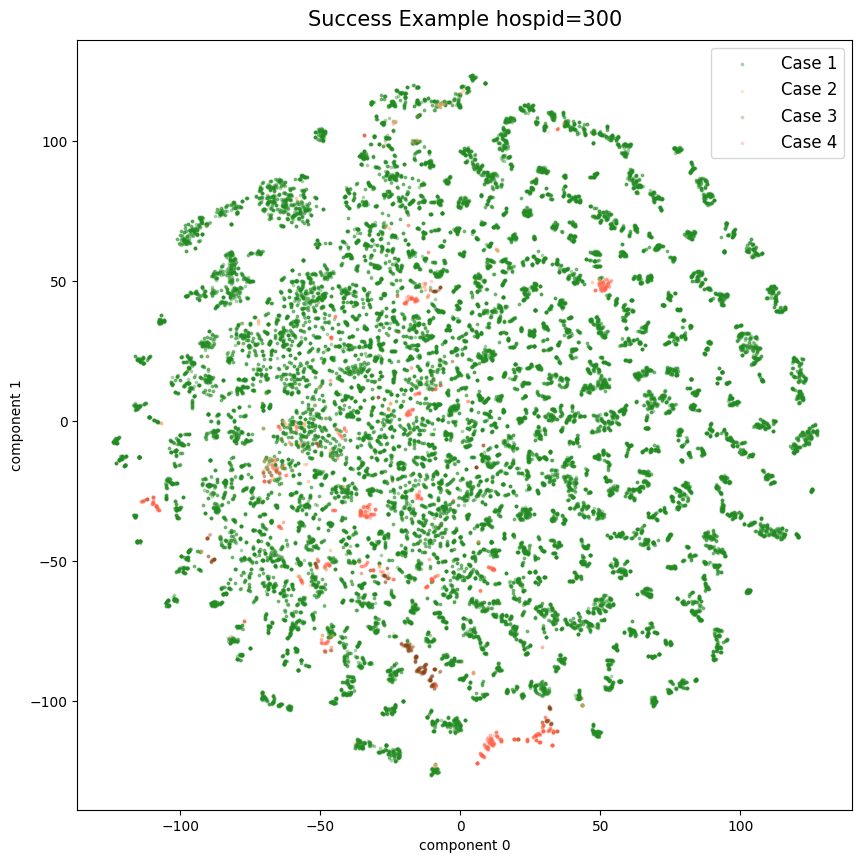

In [13]:
from sklearn.manifold import TSNE

class_feat = success_case_tsne['Case'].values

n_components = 2
model = TSNE(n_components=n_components,perplexity=30.0, random_state=42)
X_embedded = model.fit_transform(success_case_tsne.drop('Case', axis = 1))

tsne_emb_feat_df_test = pd.DataFrame(X_embedded, columns = ['component 0', 'component 1'])
tsne_emb_feat_df_test['Case'] = class_feat


plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

umap_df_1 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 1]
umap_df_2 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 2]
umap_df_3 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 3]
umap_df_4 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 4]


# target 별 시각화

plt.scatter(umap_df_1['component 0'], umap_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(umap_df_2['component 0'], umap_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(umap_df_3['component 0'], umap_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(umap_df_4['component 0'], umap_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('Success Example hospid=300', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

In [17]:
#원본 데이터 상에서는 큰 차이가 없었음
total_test = pd.concat([data.reset_index(drop=True), test_output], axis = 1).reset_index(drop=True)

failure_case = total_test[total_test['hospitalid']==458]
success_case = total_test[total_test['hospitalid']==300]

In [22]:
feature_failure_case = failure_case.iloc[:,229:]
feature_success_case = success_case.iloc[:,229:]

In [23]:
len(feature_failure_case)

22123

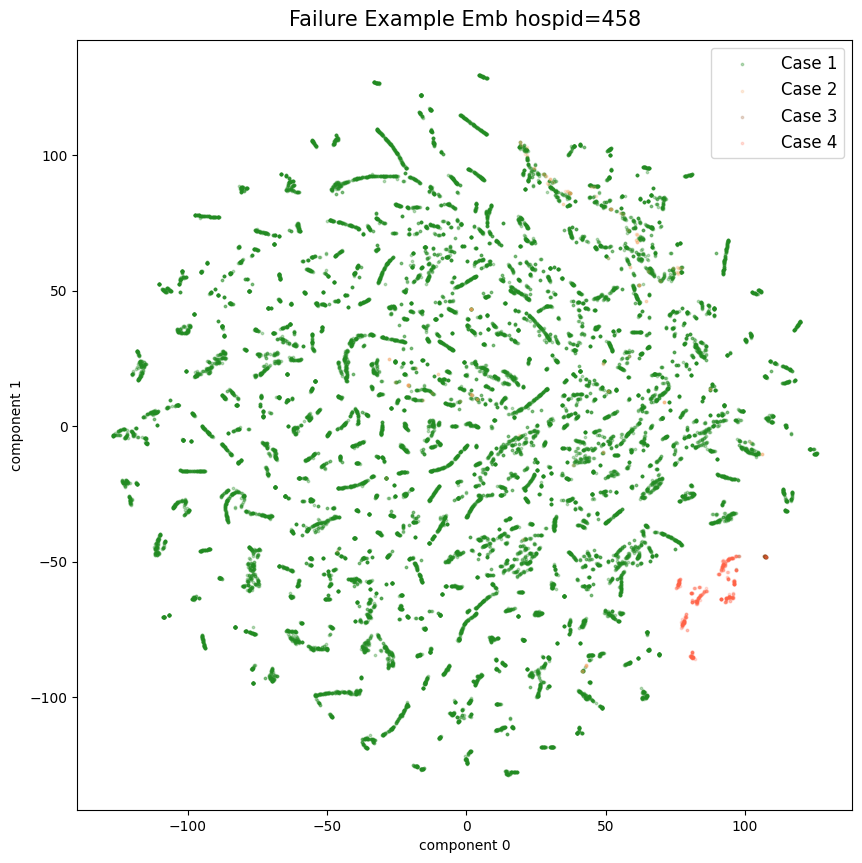

In [25]:
from sklearn.manifold import TSNE

class_feat = failure_case_tsne['Case'].values

n_components = 2
model = TSNE(n_components=n_components,perplexity=30.0, random_state=42)
X_embedded = model.fit_transform(feature_failure_case)

tsne_emb_feat_df_test = pd.DataFrame(X_embedded, columns = ['component 0', 'component 1'])
tsne_emb_feat_df_test['Case'] = class_feat


plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

umap_df_1 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 1]
umap_df_2 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 2]
umap_df_3 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 3]
umap_df_4 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 4]


# target 별 시각화

plt.scatter(umap_df_1['component 0'], umap_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(umap_df_2['component 0'], umap_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(umap_df_3['component 0'], umap_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(umap_df_4['component 0'], umap_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('Failure Example Emb hospid=458', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

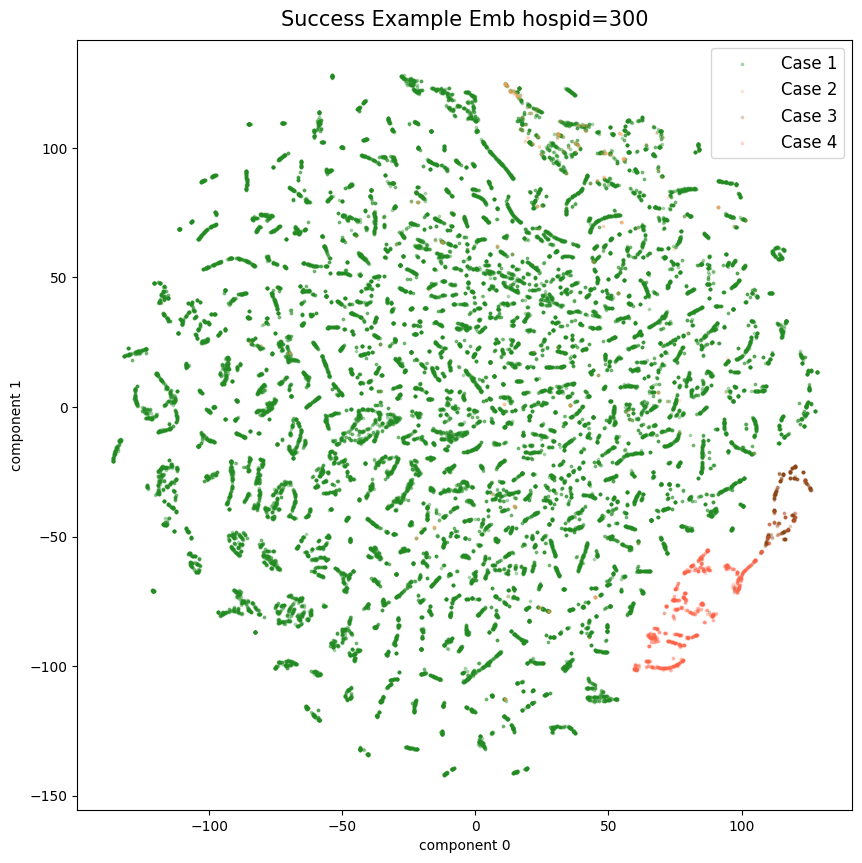

: 

In [26]:
from sklearn.manifold import TSNE

class_feat = success_case_tsne['Case'].values

n_components = 2
model = TSNE(n_components=n_components,perplexity=30.0, random_state=42)
X_embedded = model.fit_transform(feature_success_case)

tsne_emb_feat_df_test = pd.DataFrame(X_embedded, columns = ['component 0', 'component 1'])
tsne_emb_feat_df_test['Case'] = class_feat


plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

umap_df_1 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 1]
umap_df_2 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 2]
umap_df_3 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 3]
umap_df_4 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 4]


# target 별 시각화

plt.scatter(umap_df_1['component 0'], umap_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(umap_df_2['component 0'], umap_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(umap_df_3['component 0'], umap_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(umap_df_4['component 0'], umap_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('Success Example Emb hospid=300', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

In [1]:
import pandas as pd
import numpy as np
import time
import sys

from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression  
from sklearn import svm

module_path='/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Experiment(Supervised Learning)/evaluation/'
if module_path not in sys.path:
    sys.path.append(module_path)
    
from integrating_embedding import *

import integrating_embedding
from imp import reload
reload(integrating_embedding)

module_path='/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Experiment(Supervised Learning)/evaluation/'
if module_path not in sys.path:
    sys.path.append(module_path)
    
import split
import Multiclass_evaluation
import get_hospital_eicu

module_path='/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Experiment(Supervised Learning)/sub task prediction/'

if module_path not in sys.path:
    sys.path.append(module_path)

import incorperate_subtask_label


emb_path_trn_mimic = '/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/Train/result/emb_train_new_version.npy'
emb_path_vld_mimic = '/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/Train/result/emb_valid_new_version.npy'
emb_path_event_mimic = '/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/Train/result/emb_event_new_version.npy'

emb_path_trn_eicu = '/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/Train/result/emb_eicu_new_version.npy'

mimic_path = '/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Case Labeling/mimic_analysis.csv.gz'
eicu_path = '/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Case Labeling/eicu_analysis.csv.gz'

mimic_train_emb, mimic_valid_emb, event, event_emb = integrating_embedding.integrating(mimic_path, emb_path_trn_mimic, emb_path_vld_mimic, emb_path_event_mimic, 'mimic')
eicu_test_emb, event_eicu, hosp_id = integrating_embedding.integrating(eicu_path, emb_path_trn_eicu, _, _, 'eicu')
eicu_type = get_hospital_eicu.eicu_subgroup(eicu_test_emb)
unitadmitsource, unittype, unitstaytype = get_hospital_eicu.make_eicu_dataset(eicu_type)

c:\Users\DAHS\anaconda3\envs\DL\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


========== 데이터셋 분할 정보 ==========
데이터셋 비율: 학습 = 0.90, 테스트 = 0.10
학습셋 클래스 비율: Case
1.0    473941
2.0      5128
3.0     11145
4.0     19613
Name: count, dtype: int64
테스트셋 클래스 비율: Case
1.0    53103
2.0      512
3.0      873
4.0     1590
Name: count, dtype: int64
--------------------------------------
========== 클래스 비율 ==========
학습셋 클래스 비율: 0.93:0.01:0.02:0.04
테스트셋 클래스 비율: 0.95:0.01:0.02:0.03
--------------------------------------
========== 환자 및 체류 정보 ==========
학습셋 환자 수: 2907
테스트셋 환자 수: 329
학습셋 체류 수: 2961
테스트셋 체류 수: 330
--------------------------------------
========== 실험 설정 ==========
분할 시드: 9040
학습 비율: 0.9
임계값: 0.05
--------------------------------------
========== 실행 결과 ==========
총 소요 시간(초): 0.38
시도한 시행 횟수: 0


In [2]:
_, mort_mimic_valid, _ = incorperate_subtask_label.mortality_prediction_DATA(mimic_train_emb, mimic_valid_emb, eicu_test_emb)
_, los_mimic_valid, _ = incorperate_subtask_label.LOS_prediction_DATA(mimic_train_emb, mimic_valid_emb, eicu_test_emb)
_, ards4h_mimic_valid, _ = incorperate_subtask_label.ARDS4_prediction_DATA(mimic_train_emb, mimic_valid_emb, eicu_test_emb)

ARDS4h_event_valid = ards4h_mimic_valid[ards4h_mimic_valid['Annotation_ARDS']=='ARDS']
ARDS4h_event_valid['ARDS_next_4h']='event'

_, ards8h_mimic_valid, _ = incorperate_subtask_label.ARDS8_prediction_DATA(mimic_train_emb, mimic_valid_emb, eicu_test_emb)

ARDS8h_event_valid = ards8h_mimic_valid[ards8h_mimic_valid['Annotation_ARDS']=='ARDS']
ARDS8h_event_valid['ARDS_next_8h']='event'

_, sic4h_mimic_valid, _ = incorperate_subtask_label.SIC4_prediction_DATA(mimic_train_emb, mimic_valid_emb, eicu_test_emb)


SIC4h_event_valid = sic4h_mimic_valid[sic4h_mimic_valid['Annotation_SIC']=='SIC']
SIC4h_event_valid['SIC_next_4h']='event'

_, sic8h_mimic_valid, _ = incorperate_subtask_label.SIC8_prediction_DATA(mimic_train_emb, mimic_valid_emb, eicu_test_emb)

SIC8h_event_valid = sic8h_mimic_valid[sic8h_mimic_valid['Annotation_SIC']=='SIC']
SIC8h_event_valid['SIC_next_8h']='event'

In [7]:
ARDS4h_event_valid[['stay_id','Time_since_ICU_admission','Annotation_ARDS']]

,stay_id,Time_since_ICU_admission,Annotation_ARDS
26,36273152,26,ARDS
31,39347204,4,ARDS
35,35787269,3,ARDS
49,34483718,13,ARDS
50,32307723,0,ARDS
...,...,...,...
5737,39236072,4,ARDS
5831,32686570,94,ARDS
5872,32576499,40,ARDS
5890,38532085,17,ARDS


In [ ]:
from sklearn.manifold import TSNE

class_feat = final_sampled_df['Case'].values

n_components = 2
model = TSNE(n_components=n_components,perplexity=30.0, random_state=42)
X_embedded = model.fit_transform(feature)

tsne_emb_feat_df = pd.DataFrame(X_embedded, columns = ['component 0', 'component 1'])
tsne_emb_feat_df['Case'] = class_feat

plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

c_tsne_df_1 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 1]
c_tsne_df_2 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 2]
c_tsne_df_3 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 3]
c_tsne_df_4 = tsne_emb_feat_df[tsne_emb_feat_df['Case'] == 4]


# target 별 시각화

plt.scatter(c_tsne_df_1['component 0'], c_tsne_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(c_tsne_df_2['component 0'], c_tsne_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(c_tsne_df_3['component 0'], c_tsne_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(c_tsne_df_4['component 0'], c_tsne_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

In [31]:
import sys
module_path='/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/'
if module_path not in sys.path:
    sys.path.append(module_path)

from cohort_loader import *

eicu_data_dir = '/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Case Labeling/eicu_analysis.csv.gz'
df_raw_eicu = pd.read_csv(eicu_data_dir, compression='gzip')
df_raw_eicu = df_raw_eicu.drop('Shock_next_12h', axis = 1)

df_raw_eicu = df_raw_eicu[~(df_raw_eicu['gender']==2)].reset_index(drop=True)

df_raw_eicu.replace([np.inf, -np.inf], np.nan, inplace=True)
df_raw_eicu.fillna(0, inplace=True) 

df_raw_eicu = df_raw_eicu[~(df_raw_eicu['Case']=='event')]
df_raw_eicu['Case'] = pd.to_numeric(df_raw_eicu['Case'], errors='coerce')

df_raw_eicu = eicu_year_process.matching_patient(df_raw_eicu)
df_raw_eicu = df_raw_eicu[df_raw_eicu['hospitaldischargeyear']==2014]

eicu_save_load = np.load('/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Cohort_selection/Finetune/result/finetune_test_new_version.npy')
test_output = pd.DataFrame(eicu_save_load)

In [32]:
from sklearn.manifold import TSNE

total_test = pd.concat([df_raw_eicu.reset_index(drop=True), test_output], axis = 1).reset_index(drop=True)

import pandas as pd

sampled_dfs = []
for case in total_test['Case'].unique():
    # 현재 Case의 데이터 개수 확인
    case_count = total_test[total_test['Case'] == case].shape[0]
    n_samples = min(case_count, 25000)
    
    sampled_case_df = total_test[total_test['Case'] == case].sample(n=n_samples, random_state=1)
    sampled_dfs.append(sampled_case_df)

final_sampled_df = pd.concat(sampled_dfs)

print(final_sampled_df.shape)

(42286, 307)


In [33]:
feature = final_sampled_df[final_sampled_df.columns[229:]]

In [34]:
from sklearn.manifold import TSNE

class_feat = final_sampled_df['Case'].values

n_components = 2
model = TSNE(n_components=n_components,perplexity=30.0, random_state=42)
X_embedded = model.fit_transform(feature)

tsne_emb_feat_df_test = pd.DataFrame(X_embedded, columns = ['component 0', 'component 1'])
tsne_emb_feat_df_test['Case'] = class_feat

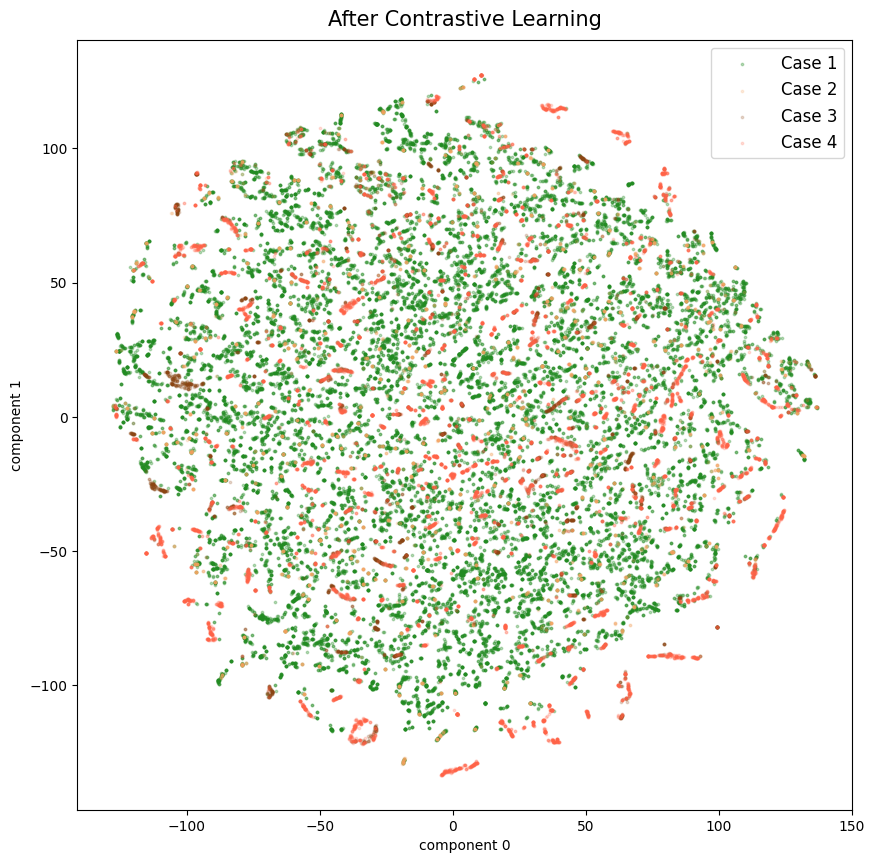

In [35]:
plt.rcParams["figure.figsize"] = (10,10)
# target 별 분리

umap_df_1 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 1]
umap_df_2 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 2]
umap_df_3 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 3]
umap_df_4 = tsne_emb_feat_df_test[tsne_emb_feat_df_test['Case'] == 4]


# target 별 시각화

plt.scatter(umap_df_1['component 0'], umap_df_1['component 1'], color = 'forestgreen', label = 'Case 1', s = 3, alpha=0.3)
plt.scatter(umap_df_2['component 0'], umap_df_2['component 1'], color = 'sandybrown', label = 'Case 2', s = 3, alpha=0.2)
plt.scatter(umap_df_3['component 0'], umap_df_3['component 1'], color = 'saddlebrown', label = 'Case 3', s = 3, alpha=0.2)
plt.scatter(umap_df_4['component 0'], umap_df_4['component 1'], color = 'tomato', label = 'Case 4', s = 3, alpha=0.2)


plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

In [1]:
eicu_data_dir = '/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/Case Labeling/eicu_analysis.csv.gz'
df_raw_eicu = pd.read_csv(eicu_data_dir, compression='gzip')

NameError: name 'pd' is not defined

In [37]:
df_raw_eicu = df_raw_eicu.drop('Shock_next_12h', axis = 1)

df_raw_eicu = df_raw_eicu[~(df_raw_eicu['gender']==2)].reset_index(drop=True)

df_raw_eicu.replace([np.inf, -np.inf], np.nan, inplace=True)
df_raw_eicu.fillna(0, inplace=True) 

df_raw_eicu = df_raw_eicu[~(df_raw_eicu['Case']=='event')]
df_raw_eicu['Case'] = pd.to_numeric(df_raw_eicu['Case'], errors='coerce')

df_raw_eicu = eicu_year_process.matching_patient(df_raw_eicu)

In [62]:
sample = df_raw_eicu[['patientunitstayid', 'hospitalid', 'hospitaldischargeyear']].groupby('hospitalid').agg('nunique').reset_index()

In [63]:
sample

,hospitalid,patientunitstayid,hospitaldischargeyear
0,58,3,2
1,59,9,2
2,60,5,2
3,63,23,2
4,66,9,2
...,...,...,...
157,445,4,2
158,449,194,2
159,452,29,2
160,458,119,2


In [64]:
hospital = sample[sample['patientunitstayid']>=10]

In [66]:
df_target = df_raw_eicu[df_raw_eicu['hospitalid'].isin(hospital['hospitalid'])]

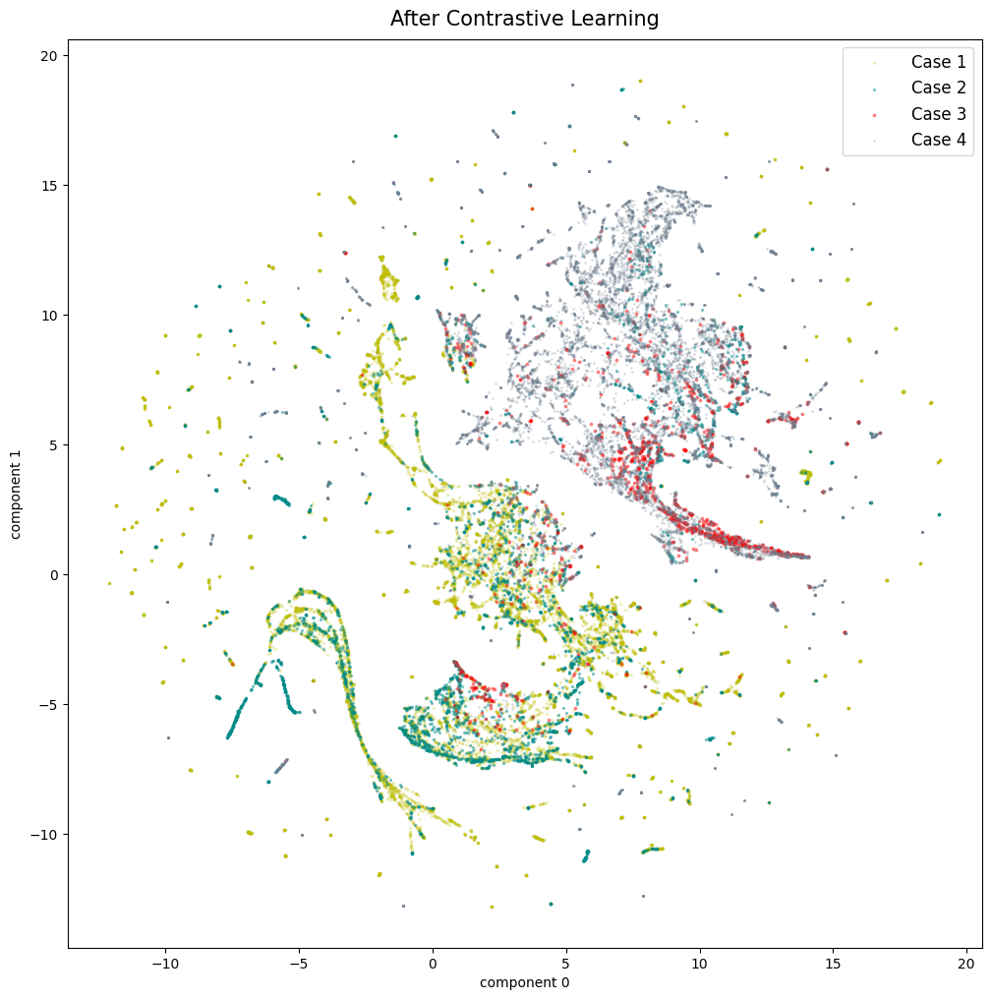

In [4]:
plt.rcParams["figure.figsize"] = (12,12)
# target 별 분리
c_tsne_df_0 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 0]
c_tsne_df_1 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 1]
c_tsne_df_2 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 2]
c_tsne_df_3 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 3]

# target 별 시각화

plt.scatter(c_tsne_df_0['component 0'], c_tsne_df_0['component 1'], color = 'y', label = 'Case 1', s = 2, alpha=0.2)
plt.scatter(c_tsne_df_1['component 0'], c_tsne_df_1['component 1'], color = 'darkcyan', label = 'Case 2', s = 2, alpha=0.4)
plt.scatter(c_tsne_df_2['component 0'], c_tsne_df_2['component 1'], color = 'red', label = 'Case 3', s = 3, alpha=0.4)
plt.scatter(c_tsne_df_3['component 0'], c_tsne_df_3['component 1'], color = 'slategray', label = 'Case 4', s = 1, alpha=0.2)

plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

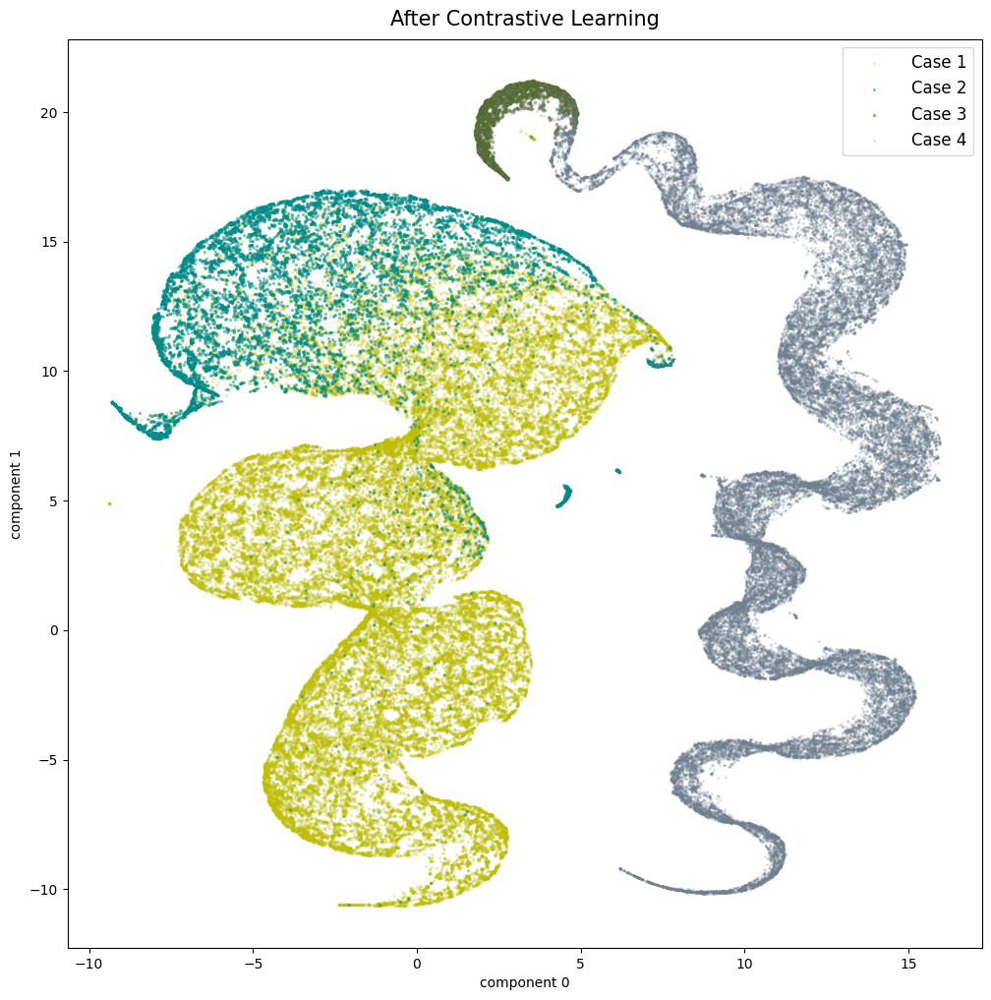

In [71]:
# plt.rcParams["figure.figsize"] = (10,9)
plt.rcParams["figure.figsize"] = (12,12)

# target 별 시각화
plt.scatter(c_tsne_df_0['component 0'], c_tsne_df_0['component 1'], color = 'y', label = 'Case 1', s = 2, alpha=0.2)
plt.scatter(c_tsne_df_1['component 0'], c_tsne_df_1['component 1'], color = 'darkcyan', label = 'Case 2', s = 2, alpha=0.4)
plt.scatter(c_tsne_df_2['component 0'], c_tsne_df_2['component 1'], color = 'darkolivegreen', label = 'Case 3', s = 3, alpha=0.4)
plt.scatter(c_tsne_df_3['component 0'], c_tsne_df_3['component 1'], color = 'slategray', label = 'Case 4', s = 1, alpha=0.2)

plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

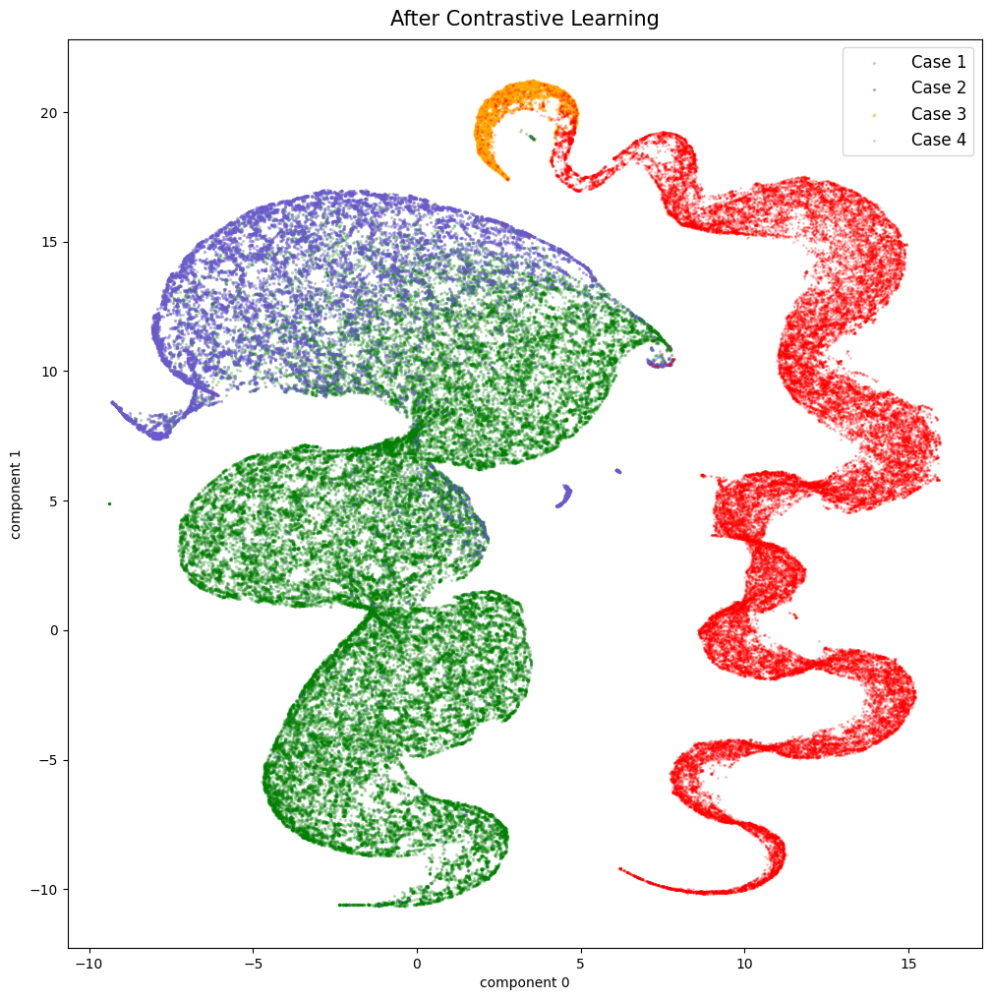

In [74]:
plt.rcParams["figure.figsize"] = (12,12)

# target 별 시각화
plt.scatter(c_tsne_df_0['component 0'], c_tsne_df_0['component 1'], color = 'green', label = 'Case 1', s = 2, alpha=0.2)
plt.scatter(c_tsne_df_1['component 0'], c_tsne_df_1['component 1'], color = 'slateblue', label = 'Case 2', s = 2, alpha=0.4)
plt.scatter(c_tsne_df_2['component 0'], c_tsne_df_2['component 1'], color = 'orange', label = 'Case 3', s = 3, alpha=0.4)
plt.scatter(c_tsne_df_3['component 0'], c_tsne_df_3['component 1'], color = 'red', label = 'Case 4', s = 1, alpha=0.2)

plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

In [35]:
embset_total = pd.read_csv('/Users/DAHS/MIMIC-IV-Data-Pipeline/MIMIC_pipeline/supervised_contrastive_learning/embedding_data.csv.gz', index_col = 0, compression='gzip')
embset_total = embset_total.rename(columns ={'43':'classes'})
embset_total = embset_total.drop(['subject_id', 'stay_id', 'hadm_id'], axis =1 )

class_feat = embset_total['classes'].values
reducer_feat = umap.UMAP()
umap_emb_feat_total = reducer_feat.fit_transform(embset_total.drop('classes', axis = 1))

umap_emb_feat_df_total = pd.DataFrame(umap_emb_feat_total, columns = ['component 0', 'component 1'])
umap_emb_feat_df_total['classes'] = class_feat

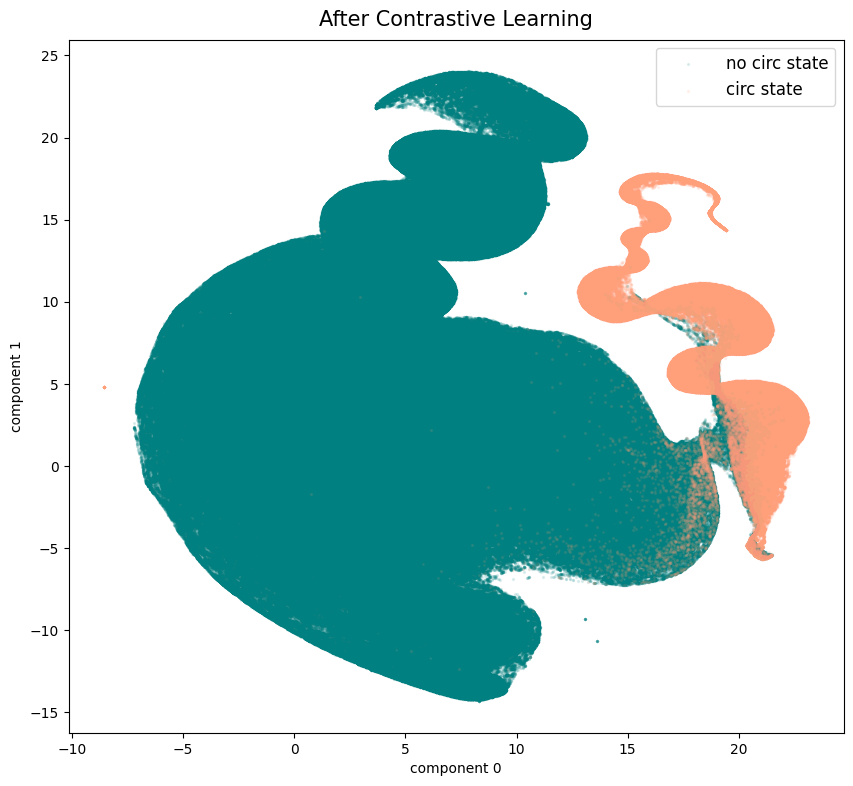

In [36]:
# target 별 분리
c_tsne_df_0_total = umap_emb_feat_df_total[umap_emb_feat_df_total['classes'] == 0]
c_tsne_df_1_total = umap_emb_feat_df_total[umap_emb_feat_df_total['classes'] == 1]
c_tsne_df_2_total = umap_emb_feat_df_total[umap_emb_feat_df_total['classes'] == 2]
c_tsne_df_3_total = umap_emb_feat_df_total[umap_emb_feat_df_total['classes'] == 3]

# target 별 시각화
plt.scatter(c_tsne_df_0_total['component 0'], c_tsne_df_0_total['component 1'], color = 'teal', s = 2, alpha=0.1)
plt.scatter(c_tsne_df_1_total['component 0'], c_tsne_df_1_total['component 1'], color = 'teal', label = 'no circ state', s = 2, alpha=0.1)
plt.scatter(c_tsne_df_2_total['component 0'], c_tsne_df_2_total['component 1'], color = 'lightsalmon', s = 1, alpha=0.1)
plt.scatter(c_tsne_df_3_total['component 0'], c_tsne_df_3_total['component 1'], color = 'lightsalmon', label = 'circ state', s = 2, alpha=0.1)

plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

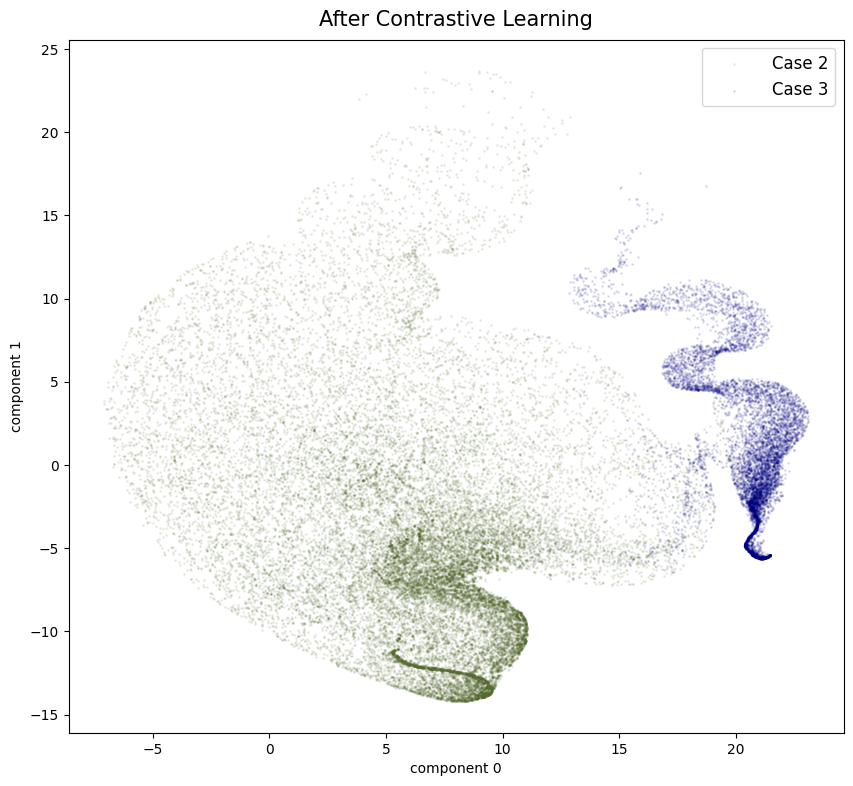

In [42]:
# target 별 시각화
# plt.scatter(c_tsne_df_0_total['component 0'], c_tsne_df_0_total['component 1'], color = 'red', label = 'Case 1', s = 0.5, alpha=0.1)
plt.scatter(c_tsne_df_1_total['component 0'], c_tsne_df_1_total['component 1'], color = 'darkolivegreen', label = 'Case 2', s = 1, alpha=0.1)
plt.scatter(c_tsne_df_2_total['component 0'], c_tsne_df_2_total['component 1'], color = 'navy', label = 'Case 3', s = 1, alpha=0.1)
# plt.scatter(c_tsne_df_3_total['component 0'], c_tsne_df_3_total['component 1'], color = 'orchid', label = 'Case 4', s = 1, alpha=0.1)

plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

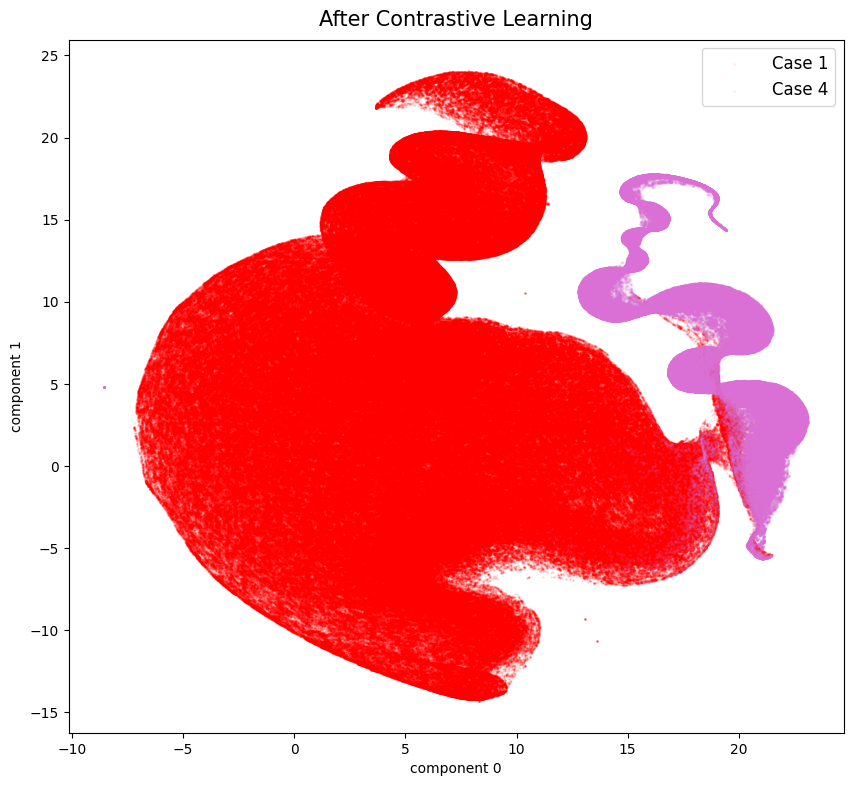

In [43]:
# target 별 시각화
plt.scatter(c_tsne_df_0_total['component 0'], c_tsne_df_0_total['component 1'], color = 'red', label = 'Case 1', s = 0.5, alpha=0.1)
# plt.scatter(c_tsne_df_1_total['component 0'], c_tsne_df_1_total['component 1'], color = 'darkolivegreen', label = 'Case 2', s = 1, alpha=0.1)
# plt.scatter(c_tsne_df_2_total['component 0'], c_tsne_df_2_total['component 1'], color = 'navy', label = 'Case 3', s = 1, alpha=0.1)
plt.scatter(c_tsne_df_3_total['component 0'], c_tsne_df_3_total['component 1'], color = 'orchid', label = 'Case 4', s = 1, alpha=0.1)

plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

In [13]:
from sklearn.manifold import TSNE
import pandas as pd
from sklearn.utils import resample

valid = pd.read_csv('/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/supervised_contrastive_learning/FT-Transformer/test_umap_transforemr.csv', index_col = 0)
valid = valid.rename(columns ={'0.1':'classes'})
print(len(valid))

df_class_0 = valid[valid['classes'] == 0]
df_class_1 = valid[valid['classes'] == 1]
df_class_2 = valid[valid['classes'] == 2]
df_class_3 = valid[valid['classes'] == 3]

max_size = df_class_1.shape[0]

df_class_0_upsampled = resample(df_class_0, replace=True, n_samples=max_size, random_state=123)
df_class_1_upsampled = resample(df_class_1, replace=True, n_samples=max_size, random_state=123)
df_class_2_upsampled = resample(df_class_2, replace=True, n_samples=max_size, random_state=123)
df_class_3_upsampled = resample(df_class_3, replace=True, n_samples=max_size, random_state=123)

valid = pd.concat([df_class_0_upsampled, df_class_1_upsampled, df_class_2_upsampled, df_class_3_upsampled]).reset_index(drop=True)
print(len(valid))       

n_components = 2
model = TSNE(n_components=n_components)
X_embedded = model.fit_transform(valid.drop('classes', axis = 1))

268541
70764


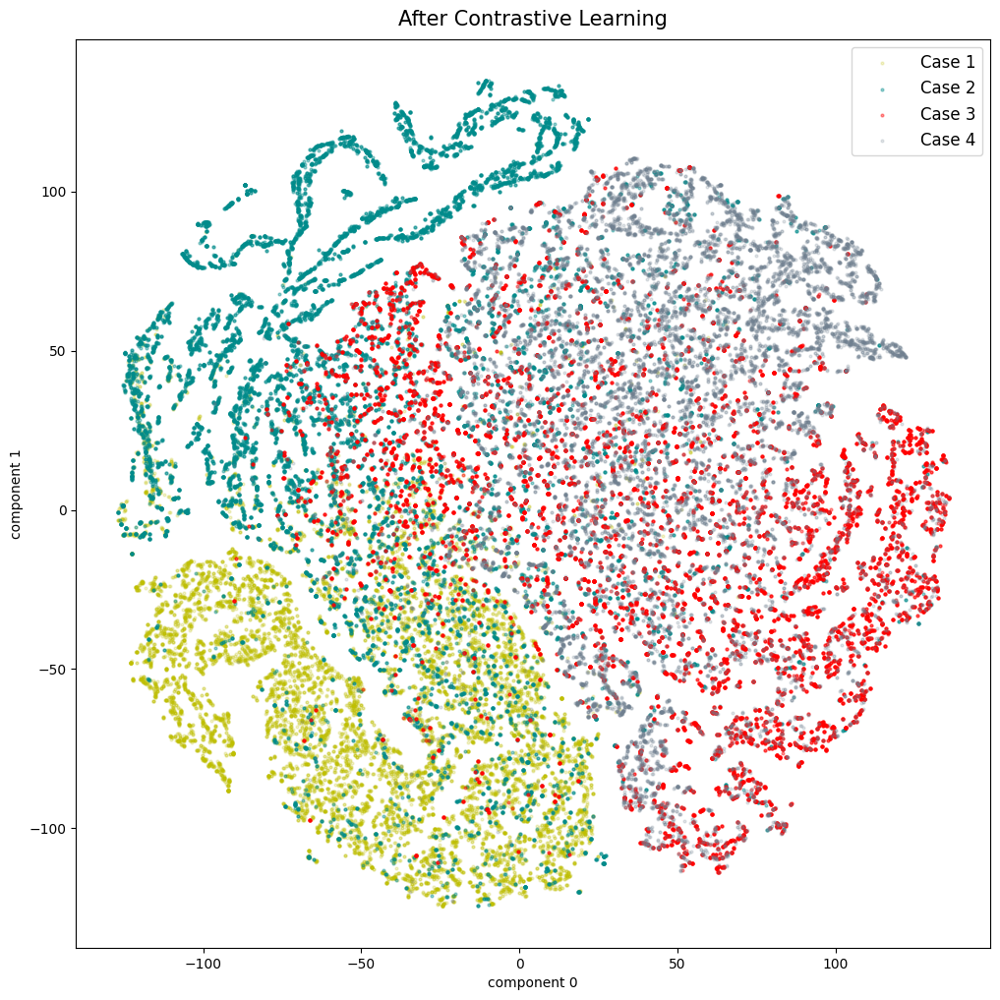

In [17]:
import matplotlib.pyplot as plt
umap_emb_feat_df = pd.DataFrame(X_embedded, columns = ['component 0', 'component 1'])
umap_emb_feat_df['classes'] = valid['classes'].values

plt.rcParams["figure.figsize"] = (12,12)
# target 별 분리
c_tsne_df_0 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 0]
c_tsne_df_1 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 1]
c_tsne_df_2 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 2]
c_tsne_df_3 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 3]

# target 별 시각화

plt.scatter(c_tsne_df_0['component 0'], c_tsne_df_0['component 1'], color = 'y', label = 'Case 1', s = 4, alpha=0.2)
plt.scatter(c_tsne_df_1['component 0'], c_tsne_df_1['component 1'], color = 'darkcyan', label = 'Case 2', s = 4, alpha=0.4)
plt.scatter(c_tsne_df_2['component 0'], c_tsne_df_2['component 1'], color = 'red', label = 'Case 3', s = 4, alpha=0.4)
plt.scatter(c_tsne_df_3['component 0'], c_tsne_df_3['component 1'], color = 'slategray', label = 'Case 4', s = 4, alpha=0.2)

plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

In [20]:
umap_emb_feat_df['classes'].value_counts().sort_index()

classes
0.0    28739
1.0     9988
Name: count, dtype: int64

In [23]:
from sklearn.manifold import TSNE
import pandas as pd
from sklearn.utils import resample

valid = pd.read_csv('/Users/DAHS/Desktop/ECP_CONT/ECP_SCL/supervised_contrastive_learning/FT-Transformer/test_umap_transforemr_vis_trn.csv', index_col = 0)
valid = valid.rename(columns ={'0.1':'classes'})
# print(len(valid))

# df_class_0 = valid[valid['classes'] == 0]
# df_class_1 = valid[valid['classes'] == 1]
# df_class_2 = valid[valid['classes'] == 2]
# df_class_3 = valid[valid['classes'] == 3]

# max_size = df_class_1.shape[0]

# df_class_0_upsampled = resample(df_class_0, replace=True, n_samples=max_size, random_state=123)
# df_class_1_upsampled = resample(df_class_1, replace=True, n_samples=max_size, random_state=123)
# df_class_2_upsampled = resample(df_class_2, replace=True, n_samples=max_size, random_state=123)
# df_class_3_upsampled = resample(df_class_3, replace=True, n_samples=max_size, random_state=123)

# valid = pd.concat([df_class_0, df_class_1]).reset_index(drop=True)
# print(len(valid))       

n_components = 2
model = TSNE(n_components=n_components)
X_embedded = model.fit_transform(valid.drop('classes', axis = 1))

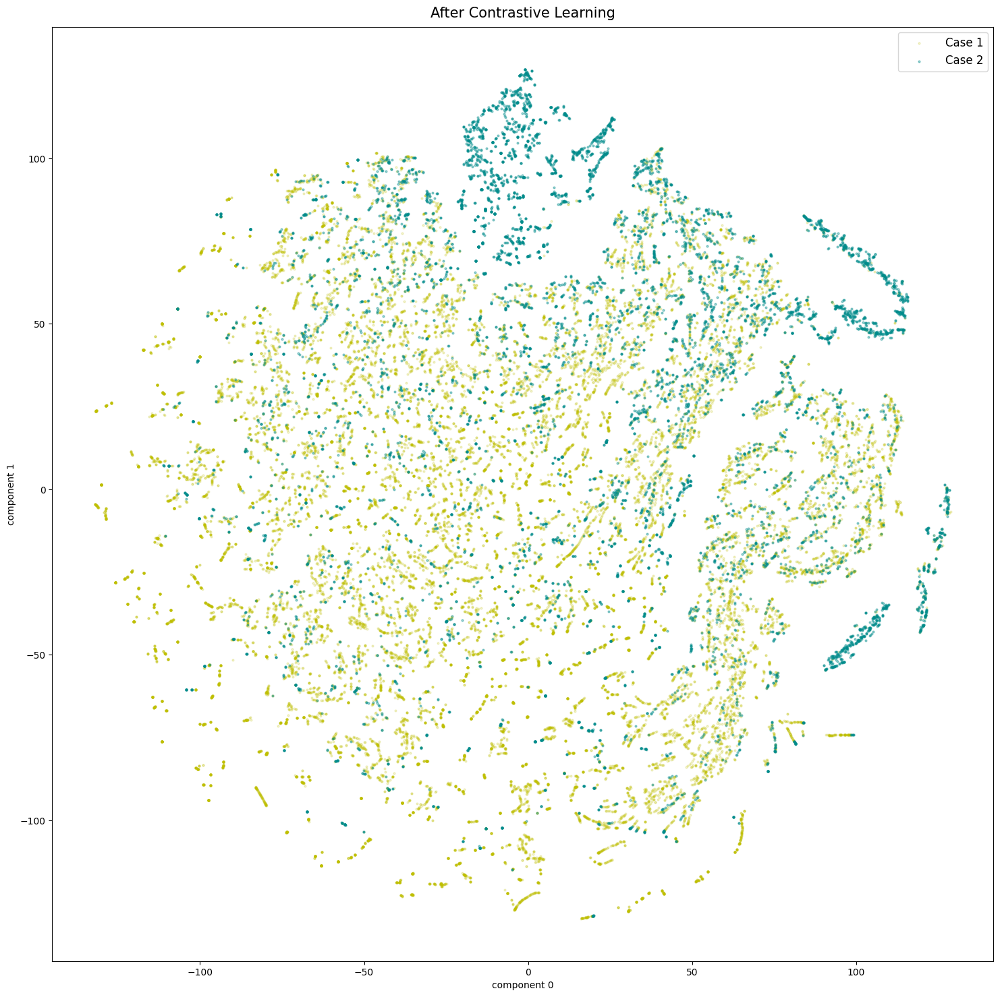

In [19]:
import matplotlib.pyplot as plt
umap_emb_feat_df = pd.DataFrame(X_embedded, columns = ['component 0', 'component 1'])
umap_emb_feat_df['classes'] = valid['classes'].values

plt.rcParams["figure.figsize"] = (18,18)
# target 별 분리
c_tsne_df_0 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 0]
c_tsne_df_1 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 1]
# c_tsne_df_2 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 2]
# c_tsne_df_3 = umap_emb_feat_df[umap_emb_feat_df['classes'] == 3]

# target 별 시각화

plt.scatter(c_tsne_df_0['component 0'], c_tsne_df_0['component 1'], color = 'y', label = 'Case 1', s = 4, alpha=0.2)
plt.scatter(c_tsne_df_1['component 0'], c_tsne_df_1['component 1'], color = 'darkcyan', label = 'Case 2', s = 4, alpha=0.4)
# plt.scatter(c_tsne_df_2['component 0'], c_tsne_df_2['component 1'], color = 'red', label = 'Case 3', s = 4, alpha=0.4)
# plt.scatter(c_tsne_df_3['component 0'], c_tsne_df_3['component 1'], color = 'slategray', label = 'Case 4', s = 4, alpha=0.2)

plt.title('After Contrastive Learning', pad = 10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3)
plt.show()

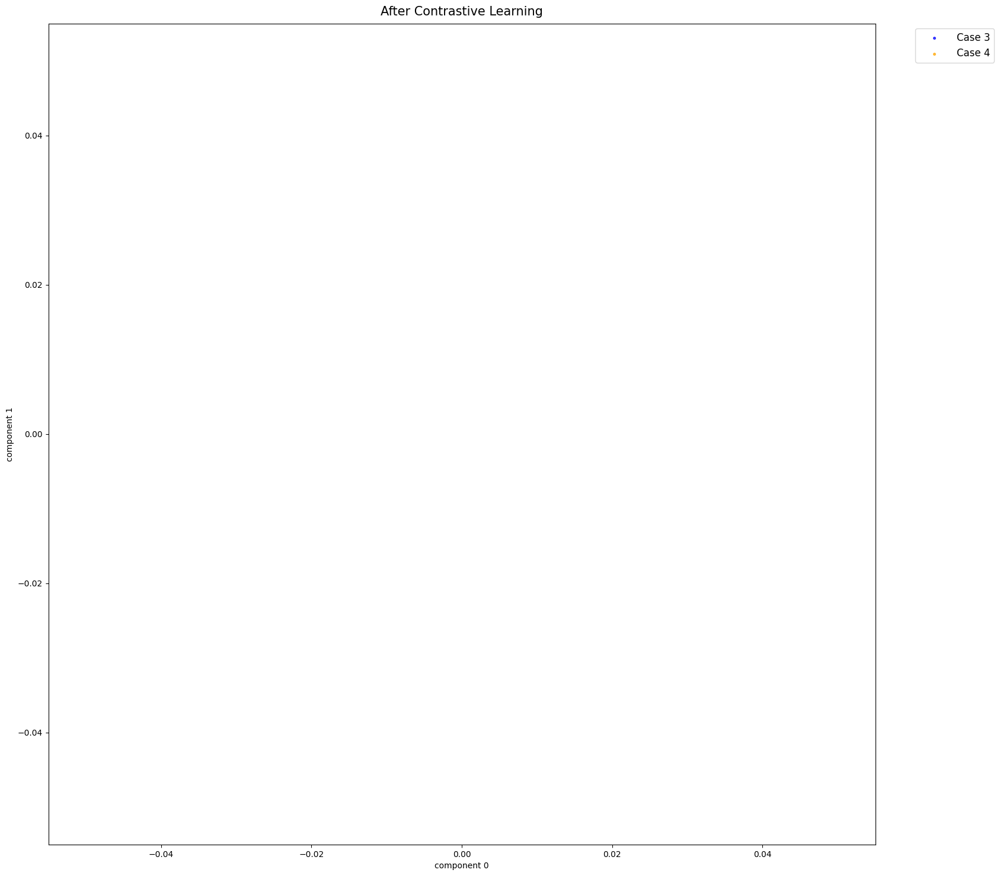

In [22]:
# 클래스의 개수 (이 경우 4)
num_classes = 2

# 사용할 색상 목록 정의 (여기서는 4가지 색상을 사용)
colors = ['red', 'green', 'blue', 'orange']

# 시각화 설정
plt.rcParams["figure.figsize"] = (18, 18)

# 클래스별로 시각화
for i in range(2, num_classes+2):
    subset = umap_emb_feat_df[umap_emb_feat_df['classes'] == i]
    plt.scatter(subset['component 0'], subset['component 1'], s=7, alpha=0.7, color=colors[i], label=f'Case {i + 1}')

# 시각화 설정
plt.title('After Contrastive Learning', pad=10, fontsize=15)
plt.xlabel('component 0')
plt.ylabel('component 1')
plt.legend(fontsize=12, handlelength=3, loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()

In [13]:
n_components = 3
model_3d = TSNE(n_components=n_components)
X_embedded_3d = model_3d.fit_transform(valid.drop('classes', axis = 1))

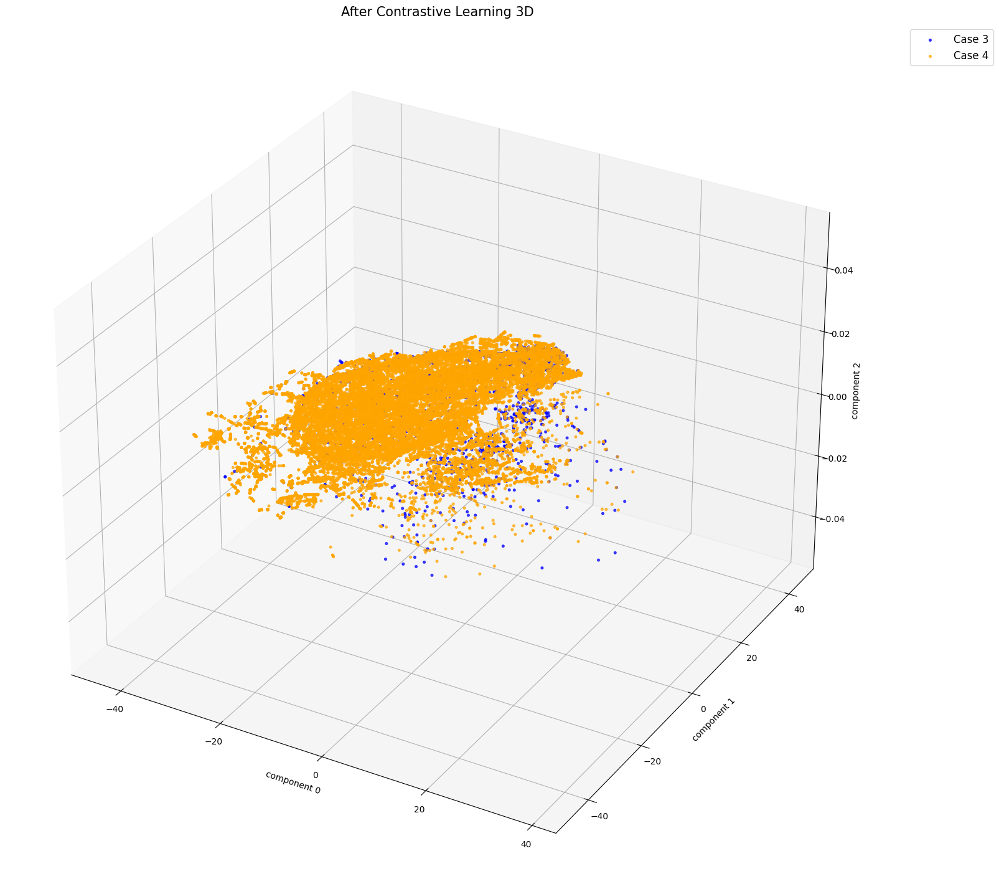

In [25]:
from mpl_toolkits.mplot3d import Axes3D

num_classes = 4

umap_emb_feat_df_3d = pd.DataFrame(X_embedded_3d, columns = ['component 0', 'component 1', 'component 2'])
umap_emb_feat_df_3d['classes'] = valid['classes'].values

# 3차원 그래프 세팅
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(111, projection='3d')

# 클래스별로 시각화
for i in range(2, num_classes):
    subset = umap_emb_feat_df_3d[umap_emb_feat_df_3d['classes'] == i]
    ax.scatter(subset['component 0'], subset['component 1'], s=7, alpha=0.7, color=colors[i], label=f'Case {i + 1}')

# 시각화 설정
plt.title('After Contrastive Learning 3D', pad=10, fontsize=15)
ax.set_xlabel('component 0')
ax.set_ylabel('component 1')
ax.set_zlabel('component 2')
ax.legend(fontsize=12, handlelength=3, loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()

MovieWriter ffmpeg unavailable; using Pillow instead.


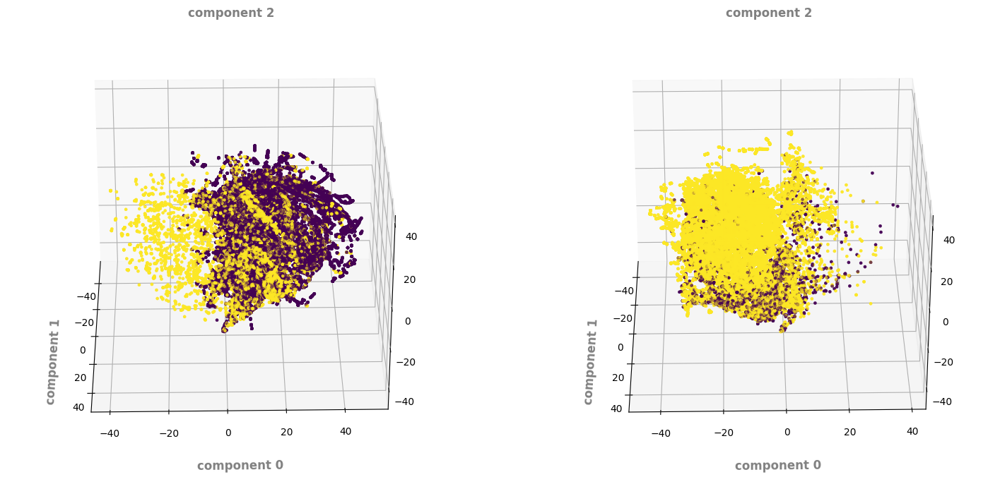

In [29]:
from matplotlib import animation
import matplotlib.pyplot as plt

# 데이터 준비
data1 = umap_emb_feat_df_3d[(umap_emb_feat_df_3d['classes']==0) | (umap_emb_feat_df_3d['classes']==1)]
data2 = umap_emb_feat_df_3d[(umap_emb_feat_df_3d['classes']==2) | (umap_emb_feat_df_3d['classes']==3)]

fig, axs = plt.subplots(ncols=2, figsize=(18, 18), subplot_kw={"projection":"3d"})

fontlabel = {"fontsize":"large", "color":"gray", "fontweight":"bold"}

def init():
    for ax, data in zip(axs, [data1, data2]):
        ydata = "component 0" if ax == axs[0] else "component 0"
        ax.set_xlabel("component 1", fontdict=fontlabel, labelpad=16)
        ax.set_ylabel(ydata, fontdict=fontlabel, labelpad=16)
        ax.set_title("component 2", fontdict=fontlabel)
        
        # 클래스에 따라 색상을 지정합니다
        scatter = ax.scatter(data["component 1"], data[ydata], data["component 2"],
                             c=data["classes"], cmap="viridis", s=5, alpha=0.5)
    
    return fig,

def animate(i):
    axs[0].view_init(elev=30., azim=i)
    axs[1].view_init(elev=30., azim=i)
    return fig,

# Animate
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=360, interval=20, blit=True)

# Save
anim.save('mpl3d_scatter.gif', fps=30)
